In [42]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import cv2

# 4. Creating a dataset for training the control model

In [28]:
base_dir = "D:/programs/SelfDrive/DATA"
scene_numb = 29551

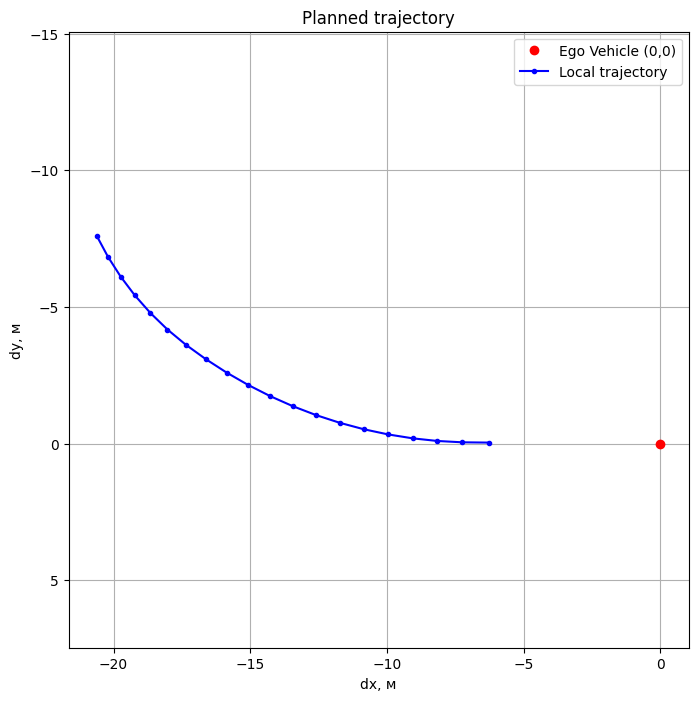

In [43]:
trajectory_path = os.path.join(base_dir, "trajectory", f"{scene_numb}.npy")
trajectory = np.load(trajectory_path)

ego_x, ego_y = 0, 0 

plt.figure(figsize=(8, 8))
plt.plot(ego_x, ego_y, 'ro', label="Ego Vehicle (0,0)")
plt.plot(trajectory[:, 0], trajectory[:, 1], 'b.-', label="Local trajectory")

plt.title("Planned trajectory")
plt.xlabel("dx, м")
plt.ylabel("dy, м")
plt.grid(True)
plt.axis('equal')
plt.gca().invert_yaxis()  
plt.legend()
plt.show()

In [2]:
def path_or_nan(path):
    return path if os.path.exists(path) else None

In [7]:
df = pd.read_csv(r"D:\programs\SelfDrive\DATA\vehicle_commands.csv")

df["rgb_camera_front"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/camera_front/{x}.png"))
df["rgb_camera_left"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/camera_left/{x}.png"))
df["rgb_camera_right"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/camera_right/{x}.png"))

df["semantic_camera_front"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/semantic_camera_front/{x}.npy"))
df["semantic_camera_left"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/semantic_camera_left/{x}.npy"))
df["semantic_camera_right"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/semantic_camera_right/{x}.npy"))

df["lidar_proj_front"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/lidar_projection_front/{x}.npz"))
df["lidar_proj_left"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/lidar_projection_left/{x}.npz"))
df["lidar_proj_right"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/lidar_projection_right/{x}.npz"))

df["trajectory"] = df["frame_id"].apply(lambda x: path_or_nan(f"{base_dir}/trajectory/{x}.npy"))

lights_df = pd.read_csv(os.path.join(base_dir, "traffic_light.csv"))

In [8]:
#One-hot encoding of traffic light states
lights_df["green"]  = (lights_df["state"] == "green").astype(int)
lights_df["yellow"] = (lights_df["state"] == "yellow").astype(int)
lights_df["red"]    = (lights_df["state"] == "red").astype(int)

In [9]:
lights_df = lights_df[["frame_id", "green", "yellow", "red"]]

In [10]:
df = df.merge(lights_df, on="frame_id", how="left")

In [11]:
df[["green", "yellow", "red"]] = df[["green", "yellow", "red"]].fillna(0).astype(int)

In [12]:
target_cols = ["speed", "steer", "throttle", "brake"]
feature_cols = [col for col in df.columns if col not in target_cols]

In [13]:
df = df[feature_cols + target_cols]
df.head()

,frame_id,rgb_camera_front,rgb_camera_left,rgb_camera_right,semantic_camera_front,semantic_camera_left,semantic_camera_right,lidar_proj_front,lidar_proj_left,lidar_proj_right,trajectory,green,yellow,red,speed,steer,throttle,brake
0,6796,D:/programs/SelfDrive/DATA/camera_front/6796.png,D:/programs/SelfDrive/DATA/camera_left/6796.png,D:/programs/SelfDrive/DATA/camera_right/6796.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6796.npy,0,0,0,22.152759,-0.000010,0.75,0.0
1,6800,D:/programs/SelfDrive/DATA/camera_front/6800.png,D:/programs/SelfDrive/DATA/camera_left/6800.png,D:/programs/SelfDrive/DATA/camera_right/6800.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6800.npy,0,0,0,24.372782,0.000014,0.75,0.0
2,6804,D:/programs/SelfDrive/DATA/camera_front/6804.png,D:/programs/SelfDrive/DATA/camera_left/6804.png,D:/programs/SelfDrive/DATA/camera_right/6804.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6804.npy,0,0,0,29.317393,0.000003,0.00,0.3
3,6808,D:/programs/SelfDrive/DATA/camera_front/6808.png,D:/programs/SelfDrive/DATA/camera_left/6808.png,D:/programs/SelfDrive/DATA/camera_right/6808.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6808.npy,0,0,0,23.751873,0.000011,0.75,0.0
4,6812,D:/programs/SelfDrive/DATA/camera_front/6812.png,D:/programs/SelfDrive/DATA/camera_left/6812.png,D:/programs/SelfDrive/DATA/camera_right/6812.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6812.npy,0,0,0,22.841153,0.000005,0.75,0.0


In [14]:
len(df)

13039

In [156]:
#Saving the raw dataset
df.to_csv(os.path.join(base_dir, "collected_data.csv"), index=False)

3.1 Data analysis and preprocessing

In [15]:
df_final = pd.read_csv(os.path.join(base_dir, "collected_data.csv"))

In [16]:
#Filtering scenes with prolonged stopping (control commands = 0)
#Keep the first and last 2 scenes
mask = (df_final["speed"] == 0.0) & \
       (df_final["steer"] == 0.0) & \
       (df_final["throttle"] == 0.0) & \
       (df_final["brake"] == 0.5)

#Grouping consecutive identical values
group = (mask != mask.shift()).cumsum()
df_final["group"] = group  #temporary addition to the dataframe

#Creating a list of indices to retain
keep = []
for g, group_df in df_final.groupby("group"):
    if group_df["speed"].iloc[0] == 0.0 and group_df["steer"].iloc[0] == 0.0 and \
       group_df["throttle"].iloc[0] == 0.0 and group_df["brake"].iloc[0] == 0.5:
        
        if len(group_df) > 4:
            keep.extend(group_df.index[:2])      
            keep.extend(group_df.index[-2:])     
        else:
            keep.extend(group_df.index)          
    else:
        keep.extend(group_df.index)              

df_final = df_final.loc[keep].reset_index(drop=True)

df_final.drop(columns=["group"], inplace=True)

#Filtering scenes by speed
df_final = df_final[df_final["speed"] <= 30]

len(df_final)

5835

In [17]:
df_final[target_cols].describe()

,speed,steer,throttle,brake
count,5835.000000,5835.000000,5835.000000,5835.000000
mean,15.688956,0.039108,0.460757,0.148482
std,11.096189,0.186073,0.355490,0.211782
min,0.000000,-0.800000,0.000000,0.000000
25%,1.033374,-0.001694,0.000000,0.000000
50%,19.484439,0.000000,0.750000,0.000000
75%,25.271087,0.008178,0.750000,0.300000
max,29.997846,0.800000,0.750000,0.500000


In [18]:
df_final.isnull().sum()

frame_id                   0
rgb_camera_front         188
rgb_camera_left          149
rgb_camera_right           0
semantic_camera_front      0
semantic_camera_left       0
semantic_camera_right      0
lidar_proj_front           0
lidar_proj_left            0
lidar_proj_right           0
trajectory                37
green                      0
yellow                     0
red                        0
speed                      0
steer                      0
throttle                   0
brake                      0
dtype: int64

In [19]:
df_final = df_final.dropna().reset_index(drop=True)

In [20]:
df_final.head()

,frame_id,rgb_camera_front,rgb_camera_left,rgb_camera_right,semantic_camera_front,semantic_camera_left,semantic_camera_right,lidar_proj_front,lidar_proj_left,lidar_proj_right,trajectory,green,yellow,red,speed,steer,throttle,brake
0,6796,D:/programs/SelfDrive/DATA/camera_front/6796.png,D:/programs/SelfDrive/DATA/camera_left/6796.png,D:/programs/SelfDrive/DATA/camera_right/6796.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6796.npy,0,0,0,22.152759,-0.000010,0.75,0.0
1,6800,D:/programs/SelfDrive/DATA/camera_front/6800.png,D:/programs/SelfDrive/DATA/camera_left/6800.png,D:/programs/SelfDrive/DATA/camera_right/6800.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6800.npy,0,0,0,24.372782,0.000014,0.75,0.0
2,6804,D:/programs/SelfDrive/DATA/camera_front/6804.png,D:/programs/SelfDrive/DATA/camera_left/6804.png,D:/programs/SelfDrive/DATA/camera_right/6804.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6804.npy,0,0,0,29.317393,0.000003,0.00,0.3
3,6808,D:/programs/SelfDrive/DATA/camera_front/6808.png,D:/programs/SelfDrive/DATA/camera_left/6808.png,D:/programs/SelfDrive/DATA/camera_right/6808.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6808.npy,0,0,0,23.751873,0.000011,0.75,0.0
4,6812,D:/programs/SelfDrive/DATA/camera_front/6812.png,D:/programs/SelfDrive/DATA/camera_left/6812.png,D:/programs/SelfDrive/DATA/camera_right/6812.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/6812.npy,0,0,0,22.841153,0.000005,0.75,0.0


In [21]:
len(df_final)

5616

In [22]:
#Display data for a random scene
df_final[df_final['frame_id'] == scene_numb]

,frame_id,rgb_camera_front,rgb_camera_left,rgb_camera_right,semantic_camera_front,semantic_camera_left,semantic_camera_right,lidar_proj_front,lidar_proj_left,lidar_proj_right,trajectory,green,yellow,red,speed,steer,throttle,brake
2211,29551,D:/programs/SelfDrive/DATA/camera_front/29551.png,D:/programs/SelfDrive/DATA/camera_left/29551.png,D:/programs/SelfDrive/DATA/camera_right/29551.png,D:/programs/SelfDrive/DATA/semantic_camera_fro...,D:/programs/SelfDrive/DATA/semantic_camera_lef...,D:/programs/SelfDrive/DATA/semantic_camera_rig...,D:/programs/SelfDrive/DATA/lidar_projection_fr...,D:/programs/SelfDrive/DATA/lidar_projection_le...,D:/programs/SelfDrive/DATA/lidar_projection_ri...,D:/programs/SelfDrive/DATA/trajectory/29551.npy,1,0,0,17.573919,0.000014,0.75,0.0


3.1 Data preprocessing for model training

In [23]:
#Loading and preprocessing RGB image
def process_rgb_image(path, size=(224, 224)):
    img = Image.open(path).convert("RGB")
    img = img.resize(size)
    img = np.array(img).astype(np.float32) / 255.0
    return img  #(224, 224, 3)

#Loading and preprocessing semantic mask
def process_semantic_mask(path, size=(224, 224)):
    mask = np.load(path)
    mask = cv2.resize(mask, size, interpolation=cv2.INTER_NEAREST)
    return mask.astype(np.int64)  #(224, 224)

#Loading and preprocessing LiDAR point projection (into a depth map)
def process_lidar_projection(path, size=(224, 224)):
    data = np.load(path)
    uvs = data["pixels"]  #(N, 2)
    depths = data["depths"]  #(N,)

    depth_map = np.zeros(size, dtype=np.float32)
    for (u, v), d in zip(uvs, depths):
        u, v = int(u * size[0] / 1280), int(v * size[1] / 720)
        if 0 <= u < size[0] and 0 <= v < size[1]:
            depth_map[v, u] = d  #y, x
    return depth_map  #(224, 224)

#Loading and processing trajectory
def load_trajectory_from_npy(path):
    traj = np.load(path)  #(10, 2)
    traj = traj.astype(np.float32)
    return traj

In [24]:
def load_scene(frame_id, df):
    row = df[df["frame_id"] == frame_id].iloc[0]

    rgb_front = process_rgb_image(os.path.join(base_dir, row["rgb_camera_front"]))
    rgb_left  = process_rgb_image(os.path.join(base_dir, row["rgb_camera_left"]))
    rgb_right = process_rgb_image(os.path.join(base_dir, row["rgb_camera_right"]))

    sem_front = process_semantic_mask(os.path.join(base_dir, row["semantic_camera_front"]))
    sem_left  = process_semantic_mask(os.path.join(base_dir, row["semantic_camera_left"]))
    sem_right = process_semantic_mask(os.path.join(base_dir, row["semantic_camera_right"]))

    lidar_front = process_lidar_projection(os.path.join(base_dir, row["lidar_proj_front"]))
    lidar_left  = process_lidar_projection(os.path.join(base_dir, row["lidar_proj_left"]))
    lidar_right = process_lidar_projection(os.path.join(base_dir, row["lidar_proj_right"]))

    traj = load_trajectory_from_npy(os.path.join(base_dir, row["trajectory"]))
    
    lights = {
        "green": row["green"],
        "red": row["red"],
        "yellow": row["yellow"]
    }
    
    target = {
        "speed": row["speed"],
        "steer": row["steer"],
        "throttle": row["throttle"],
        "brake": row["brake"]
    }

    return {
        "rgb": [rgb_front, rgb_left, rgb_right],
        "semantic": [sem_front, sem_left, sem_right],
        "lidar": [lidar_front, lidar_left, lidar_right],
        "trajectory": traj,
        "lights": lights,
        "target": target
    }

3.2 Preparing the dataset for model training

In [26]:
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm 

dataset = []

def process_frame(frame_id):
    try:
        return load_scene(frame_id, df_final)
    except Exception as e:
        print(f"error_frame_id={frame_id}: {e}")
        return None
    
num_threads = 12
with ThreadPoolExecutor(max_workers=num_threads) as executor:
    futures = [executor.submit(process_frame, fid) for fid in df_final["frame_id"]]
    for future in tqdm(as_completed(futures), total=len(futures)):
        result = future.result()
        if result is not None:
            dataset.append(result)

error_frame_id=6796: name 'Image' is not defined
error_frame_id=6800: name 'Image' is not defined
error_frame_id=6804: name 'Image' is not defined
error_frame_id=6808: name 'Image' is not defined
error_frame_id=6812: name 'Image' is not defined
error_frame_id=6816: name 'Image' is not defined
error_frame_id=6820: name 'Image' is not defined
error_frame_id=6824: name 'Image' is not defined
error_frame_id=6828: name 'Image' is not defined
error_frame_id=6832: name 'Image' is not defined
error_frame_id=6836: name 'Image' is not defined
error_frame_id=6840: name 'Image' is not defined
error_frame_id=6848: name 'Image' is not defined
error_frame_id=6852: name 'Image' is not defined
error_frame_id=6844: name 'Image' is not defined
error_frame_id=6860: name 'Image' is not defined
error_frame_id=6864: name 'Image' is not defined
error_frame_id=6856: name 'Image' is not defined
error_frame_id=6872: name 'Image' is not defined
error_frame_id=6876: name 'Image' is not defined
error_frame_id=6880:

error_frame_id=9376: name 'Image' is not defined
error_frame_id=10196: name 'Image' is not defined
error_frame_id=10200: name 'Image' is not defined
error_frame_id=10204: name 'Image' is not defined
error_frame_id=10208: name 'Image' is not defined
error_frame_id=10212: name 'Image' is not defined
error_frame_id=10216: name 'Image' is not defined
error_frame_id=10220: name 'Image' is not defined
error_frame_id=10224: name 'Image' is not defined
error_frame_id=10228: name 'Image' is not defined
error_frame_id=10232: name 'Image' is not defined
error_frame_id=10236: name 'Image' is not defined
error_frame_id=10240: name 'Image' is not defined
error_frame_id=10244: name 'Image' is not defined
error_frame_id=9696: name 'Image' is not defined
error_frame_id=10252: name 'Image' is not defined
error_frame_id=9468: name 'Image' is not defined
error_frame_id=10260: name 'Image' is not defined
error_frame_id=10264: name 'Image' is not defined
error_frame_id=10268: name 'Image' is not defined
err

error_frame_id=19715: name 'Image' is not definederror_frame_id=19023: name 'Image' is not defined
error_frame_id=19759: name 'Image' is not defined
error_frame_id=19775: name 'Image' is not defined
error_frame_id=19779: name 'Image' is not defined
error_frame_id=19783: name 'Image' is not defined
error_frame_id=19787: name 'Image' is not defined
error_frame_id=19791: name 'Image' is not defined
error_frame_id=19795: name 'Image' is not defined
error_frame_id=20255: name 'Image' is not defined
error_frame_id=20259: name 'Image' is not defined
error_frame_id=20263: name 'Image' is not defined
error_frame_id=20267: name 'Image' is not defined
error_frame_id=19751: name 'Image' is not defined
error_frame_id=20275: name 'Image' is not defined
error_frame_id=20279: name 'Image' is not defined
error_frame_id=20283: name 'Image' is not defined
error_frame_id=20287: name 'Image' is not defined
error_frame_id=17823: name 'Image' is not defined
error_frame_id=20295: name 'Image' is not defined
e

error_frame_id=25103: name 'Image' is not defined
error_frame_id=25139: name 'Image' is not defined
error_frame_id=23927: name 'Image' is not defined
error_frame_id=25147: name 'Image' is not defined
error_frame_id=25151: name 'Image' is not defined
error_frame_id=25155: name 'Image' is not defined
error_frame_id=25159: name 'Image' is not defined
error_frame_id=23523: name 'Image' is not defined
error_frame_id=25167: name 'Image' is not defined
error_frame_id=25171: name 'Image' is not defined
error_frame_id=25175: name 'Image' is not defined
error_frame_id=25179: name 'Image' is not defined
error_frame_id=25183: name 'Image' is not defined
error_frame_id=25187: name 'Image' is not defined
error_frame_id=25119: name 'Image' is not defined
error_frame_id=25195: name 'Image' is not defined
error_frame_id=25199: name 'Image' is not defined
error_frame_id=25203: name 'Image' is not defined
error_frame_id=25207: name 'Image' is not defined
error_frame_id=25087: name 'Image' is not defined


error_frame_id=30267: name 'Image' is not definederror_frame_id=29975: name 'Image' is not defined
error_frame_id=30031: name 'Image' is not defined
error_frame_id=52351: name 'Image' is not defined
error_frame_id=52355: name 'Image' is not defined
error_frame_id=52359: name 'Image' is not defined
error_frame_id=52363: name 'Image' is not defined
error_frame_id=52367: name 'Image' is not defined
error_frame_id=52371: name 'Image' is not defined
error_frame_id=52375: name 'Image' is not defined
error_frame_id=52379: name 'Image' is not defined
error_frame_id=52383: name 'Image' is not defined
error_frame_id=52387: name 'Image' is not defined
error_frame_id=52391: name 'Image' is not defined
error_frame_id=52395: name 'Image' is not defined
error_frame_id=52347: name 'Image' is not defined
error_frame_id=29995: name 'Image' is not defined
error_frame_id=52407: name 'Image' is not defined
error_frame_id=52411: name 'Image' is not defined
error_frame_id=52415: name 'Image' is not defined
e

error_frame_id=52570: name 'Image' is not definederror_frame_id=52254: name 'Image' is not defined
error_frame_id=53034: name 'Image' is not defined
error_frame_id=53038: name 'Image' is not defined
error_frame_id=53042: name 'Image' is not defined
error_frame_id=52810: name 'Image' is not defined
error_frame_id=53050: name 'Image' is not defined
error_frame_id=53054: name 'Image' is not defined
error_frame_id=53114: name 'Image' is not defined
error_frame_id=53118: name 'Image' is not defined
error_frame_id=53122: name 'Image' is not defined
error_frame_id=53126: name 'Image' is not defined
error_frame_id=53130: name 'Image' is not defined
error_frame_id=52926: name 'Image' is not defined
error_frame_id=53210: name 'Image' is not defined
error_frame_id=53214: name 'Image' is not defined
error_frame_id=53218: name 'Image' is not defined
error_frame_id=53222: name 'Image' is not defined
error_frame_id=53226: name 'Image' is not defined
error_frame_id=53230: name 'Image' is not defined
e

error_frame_id=69927: name 'Image' is not definederror_frame_id=69879: name 'Image' is not defined
error_frame_id=69447: name 'Image' is not defined
error_frame_id=69971: name 'Image' is not defined
error_frame_id=69975: name 'Image' is not defined
error_frame_id=69979: name 'Image' is not defined
error_frame_id=69983: name 'Image' is not defined
error_frame_id=69987: name 'Image' is not defined
error_frame_id=69991: name 'Image' is not defined
error_frame_id=69951: name 'Image' is not defined
error_frame_id=69999: name 'Image' is not defined
error_frame_id=70003: name 'Image' is not defined
error_frame_id=70007: name 'Image' is not defined
error_frame_id=70011: name 'Image' is not defined
error_frame_id=70015: name 'Image' is not defined
error_frame_id=70019: name 'Image' is not defined
error_frame_id=70023: name 'Image' is not defined
error_frame_id=70027: name 'Image' is not defined
error_frame_id=70031: name 'Image' is not defined
error_frame_id=70035: name 'Image' is not defined
e

  0%|                                                                                                           | 0/5616 [00:00<?, ?it/s]

error_frame_id=69511: name 'Image' is not definederror_frame_id=71031: name 'Image' is not defined
error_frame_id=71475: name 'Image' is not defined
error_frame_id=71503: name 'Image' is not defined
error_frame_id=71507: name 'Image' is not defined
error_frame_id=71511: name 'Image' is not defined
error_frame_id=71515: name 'Image' is not defined
error_frame_id=71519: name 'Image' is not defined
error_frame_id=71971: name 'Image' is not defined
error_frame_id=71975: name 'Image' is not defined
error_frame_id=71979: name 'Image' is not defined
error_frame_id=71983: name 'Image' is not defined
error_frame_id=71495: name 'Image' is not defined
error_frame_id=71991: name 'Image' is not defined
error_frame_id=71487: name 'Image' is not defined
error_frame_id=71999: name 'Image' is not defined
error_frame_id=69955: name 'Image' is not defined
error_frame_id=72007: name 'Image' is not defined
error_frame_id=72011: name 'Image' is not defined
error_frame_id=72015: name 'Image' is not defined
e

error_frame_id=78315: name 'Image' is not definederror_frame_id=79395: name 'Image' is not defined
error_frame_id=78427: name 'Image' is not defined
error_frame_id=79427: name 'Image' is not defined
error_frame_id=79399: name 'Image' is not defined
error_frame_id=77403: name 'Image' is not defined
error_frame_id=79439: name 'Image' is not defined
error_frame_id=79443: name 'Image' is not defined
error_frame_id=77931: name 'Image' is not defined
error_frame_id=79451: name 'Image' is not defined
error_frame_id=79455: name 'Image' is not defined
error_frame_id=79459: name 'Image' is not defined
error_frame_id=79463: name 'Image' is not defined
error_frame_id=79467: name 'Image' is not defined
error_frame_id=79471: name 'Image' is not defined
error_frame_id=79435: name 'Image' is not defined
error_frame_id=79479: name 'Image' is not defined
error_frame_id=79819: name 'Image' is not defined
error_frame_id=79823: name 'Image' is not defined
error_frame_id=79827: name 'Image' is not defined
e

 83%|█████████████████████████████████████████████████████████████████████████████▎               | 4666/5616 [00:00<00:00, 37353.08it/s]

error_frame_id=90936: name 'Image' is not definederror_frame_id=92068: name 'Image' is not defined
error_frame_id=92420: name 'Image' is not defined
error_frame_id=92720: name 'Image' is not defined
error_frame_id=92724: name 'Image' is not defined
error_frame_id=91560: name 'Image' is not defined
error_frame_id=92732: name 'Image' is not defined
error_frame_id=92736: name 'Image' is not defined
error_frame_id=92740: name 'Image' is not defined
error_frame_id=92744: name 'Image' is not defined
error_frame_id=92748: name 'Image' is not defined
error_frame_id=90512: name 'Image' is not defined
error_frame_id=92756: name 'Image' is not defined
error_frame_id=91784: name 'Image' is not defined
error_frame_id=92764: name 'Image' is not defined
error_frame_id=92768: name 'Image' is not defined
error_frame_id=92772: name 'Image' is not defined
error_frame_id=92776: name 'Image' is not defined
error_frame_id=92780: name 'Image' is not defined
error_frame_id=90248: name 'Image' is not defined
e

error_frame_id=95676: name 'Image' is not defined
error_frame_id=96016: name 'Image' is not defined
error_frame_id=96020: name 'Image' is not defined
error_frame_id=96024: name 'Image' is not defined
error_frame_id=96028: name 'Image' is not defined
error_frame_id=95996: name 'Image' is not defined
error_frame_id=96036: name 'Image' is not defined
error_frame_id=96040: name 'Image' is not defined
error_frame_id=96008: name 'Image' is not defined
error_frame_id=96048: name 'Image' is not defined
error_frame_id=96052: name 'Image' is not defined
error_frame_id=96056: name 'Image' is not defined
error_frame_id=96012: name 'Image' is not defined
error_frame_id=96064: name 'Image' is not defined
error_frame_id=96068: name 'Image' is not defined
error_frame_id=96072: name 'Image' is not defined
error_frame_id=96076: name 'Image' is not defined
error_frame_id=96080: name 'Image' is not defined
error_frame_id=96032: name 'Image' is not defined
error_frame_id=96060: name 'Image' is not defined


error_frame_id=96780: name 'Image' is not defined
error_frame_id=97656: name 'Image' is not defined
error_frame_id=97660: name 'Image' is not defined
error_frame_id=97664: name 'Image' is not defined
error_frame_id=97668: name 'Image' is not defined
error_frame_id=97672: name 'Image' is not defined
error_frame_id=97676: name 'Image' is not defined
error_frame_id=96508: name 'Image' is not defined
error_frame_id=97684: name 'Image' is not defined
error_frame_id=97688: name 'Image' is not defined
error_frame_id=97692: name 'Image' is not defined
error_frame_id=97696: name 'Image' is not defined
error_frame_id=97700: name 'Image' is not defined
error_frame_id=97704: name 'Image' is not defined
error_frame_id=97472: name 'Image' is not defined
error_frame_id=97712: name 'Image' is not defined
error_frame_id=97716: name 'Image' is not defined
error_frame_id=97720: name 'Image' is not defined
error_frame_id=97724: name 'Image' is not defined
error_frame_id=97640: name 'Image' is not defined


100%|█████████████████████████████████████████████████████████████████████████████████████████████| 5616/5616 [00:00<00:00, 12681.79it/s]


In [27]:
len(dataset)

0

In [189]:
import pickle
with open("processed_dataset.pkl", "wb") as f:
    pickle.dump(dataset, f)

In [194]:
dataset_path = r"D:\programs\SelfDrive\processed_dataset.pkl"

with open(dataset_path, "rb") as f:
    dataset = pickle.load(f)

In [278]:
#Dataset as a list of dictionaries with road scenes
dataset

[{'rgb': [array([[[0.05882353, 0.04705882, 0.02352941],
           [0.07058824, 0.05490196, 0.03921569],
           [0.09411765, 0.07843138, 0.04705882],
           ...,
           [0.03921569, 0.03529412, 0.03137255],
           [0.15294118, 0.10196079, 0.09019608],
           [0.23137255, 0.16078432, 0.13725491]],
   
          [[0.03921569, 0.02745098, 0.01176471],
           [0.07058824, 0.05098039, 0.01960784],
           [0.09019608, 0.07843138, 0.04705882],
           ...,
           [0.11764706, 0.08235294, 0.07450981],
           [0.24313726, 0.16862746, 0.14509805],
           [0.25882354, 0.18431373, 0.15294118]],
   
          [[0.02352941, 0.01960784, 0.01176471],
           [0.04705882, 0.03529412, 0.02352941],
           [0.07058824, 0.05490196, 0.03529412],
           ...,
           [0.21176471, 0.14509805, 0.12941177],
           [0.2627451 , 0.18431373, 0.15686275],
           [0.25882354, 0.1882353 , 0.15686275]],
   
          ...,
   
          [[0.18039216, 0.176

# 4. Initialization and training of the control model

4.1 Dataset for loading data from processed_dataset

In [240]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset

class CarlaDataset(Dataset):
    def __init__(self, data):
        self.data = data

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        scene = self.data[idx]

        #Input images
        #RGB: (3, 224, 224, 3) - (3, 3, 224, 224)
        rgb = torch.from_numpy(np.stack(scene["rgb"])).permute(0, 3, 1, 2).float()  #(3, 3, 224, 224)
        rgb = rgb.reshape(-1, 224, 224)  # → (9, 224, 224)

        #Lidar: (3, 224, 224)
        lidar = torch.from_numpy(np.stack(scene["lidar"])).float()  #(3, 224, 224)

        #Semantic: (3, 224, 224)
        semantic = torch.from_numpy(np.stack(scene["semantic"])).float()  #(3, 224, 224)

        #Concatenation: 9 + 3 + 3 = 15 
        input_tensor = torch.cat([rgb, lidar, semantic], dim=0)  #(15, 224, 224)

        #Additional features
        trajectory_tensor = torch.from_numpy(scene["trajectory"]).float()  #(10, 2)

        lights = scene["lights"]
        light_tensor = torch.tensor([
            lights["green"],
            lights["red"],
            lights["yellow"]
        ], dtype=torch.float32)  # (3,)

        #Target variables
        target = scene["target"]
        target_tensor = torch.tensor([
            target["speed"],
            target["steer"],
            target["throttle"],
            target["brake"]
        ], dtype=torch.float32)  # (4,)

        return {
            "input": input_tensor,              #(15, 224, 224)
            "trajectory": trajectory_tensor,    #(10, 2)
            "traffic_lights": light_tensor,     #(3,)
            "target": target_tensor             #(4,)
        }

In [241]:
from sklearn.model_selection import train_test_split
train_data, temp_data = train_test_split(dataset, test_size=0.3, random_state=42)

In [242]:
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

In [243]:
train_dataset = CarlaDataset(train_data)
val_dataset   = CarlaDataset(val_data)
test_dataset  = CarlaDataset(test_data)

4.2 Model, optimizer, and loss function initialization

In [265]:
class CarlaControlModel(nn.Module):
    def __init__(self):
        super().__init__()

        #CNN block for processing the input image (15 channels)
        self.conv = nn.Sequential(
            nn.Conv2d(15, 32, kernel_size=5, stride=2, padding=2),  
            nn.BatchNorm2d(32),
            nn.ReLU(),

            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1), 
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),  
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.AdaptiveAvgPool2d((1, 1)) 
        )

        self.fc_image = nn.Linear(128, 64)

        #Block for processing the planned trajectory
        self.fc_traj = nn.Sequential(
            nn.Linear(20 * 2, 32),
            nn.ReLU(),
            nn.Linear(32, 16)
        )

        #Block for processing traffic light signals
        self.fc_lights = nn.Sequential(
            nn.Linear(3, 8),
            nn.ReLU()
        )

        #Final block for predicting control commands
        self.head = nn.Sequential(
            nn.Linear(64 + 16 + 8, 64),
            nn.ReLU(),
            nn.Linear(64, 4) 
        )

    def forward(self, input_img, trajectory, traffic_lights):
        x = self.conv(input_img)  
        x = x.view(x.size(0), -1)  
        x = self.fc_image(x)      

        traj = self.fc_traj(trajectory.view(trajectory.size(0), -1)) 
        lights = self.fc_lights(traffic_lights) 

        combined = torch.cat([x, traj, lights], dim=1)  
        out = self.head(combined)  

        return out
        
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CarlaControlModel().to(device)

In [266]:
criterion = nn.MSELoss()  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

4.3 Creating the DataLoader

In [267]:
from torch.utils.data import DataLoader

In [268]:
BATCH_SIZE = 32

In [269]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

4.4 Training loop

In [270]:
from tqdm import tqdm 

In [271]:
EPOCHS = 120
best_val_loss = float('inf')

train_losses = []
val_losses = []

for epoch in range(EPOCHS):
    print(f"\nEpoch {epoch+1}/{EPOCHS}")
    start_time = time.time()

    model.train()
    train_loss = 0.0

    for batch in tqdm(train_loader, desc="Training"):
        inputs = batch["input"].to(device)
        traj = batch["trajectory"].to(device)
        lights = batch["traffic_lights"].to(device)
        targets = batch["target"].to(device)

        optimizer.zero_grad()
        outputs = model(inputs, traj, lights)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0.0

    with torch.no_grad():
        for batch in tqdm(val_loader, desc="Validation"):
            inputs = batch["input"].to(device)
            traj = batch["trajectory"].to(device)
            lights = batch["traffic_lights"].to(device)
            targets = batch["target"].to(device)

            outputs = model(inputs, traj, lights)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    elapsed = time.time() - start_time
    print(f"Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Time: {elapsed:.2f}s")

    #Save Best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), "best_model.pth")
        print("Model saved")


Epoch 1/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.89it/s]


Train Loss: 82.1458 | Val Loss: 54.8964 | Time: 23.77s
Model saved

Epoch 2/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]


Train Loss: 34.5095 | Val Loss: 20.2245 | Time: 20.27s
Model saved

Epoch 3/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.01it/s]


Train Loss: 20.8815 | Val Loss: 18.7738 | Time: 21.24s
Model saved

Epoch 4/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.24it/s]


Train Loss: 20.0223 | Val Loss: 18.4009 | Time: 20.86s
Model saved

Epoch 5/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.44it/s]


Train Loss: 19.0142 | Val Loss: 17.3142 | Time: 21.34s
Model saved

Epoch 6/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.68it/s]


Train Loss: 18.4163 | Val Loss: 18.5971 | Time: 21.49s

Epoch 7/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.59it/s]


Train Loss: 17.9440 | Val Loss: 16.5702 | Time: 20.96s
Model saved

Epoch 8/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.09it/s]


Train Loss: 17.4293 | Val Loss: 15.9587 | Time: 22.98s
Model saved

Epoch 9/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.15it/s]


Train Loss: 16.9677 | Val Loss: 16.1503 | Time: 22.56s

Epoch 10/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.56it/s]


Train Loss: 16.5358 | Val Loss: 17.5896 | Time: 22.61s

Epoch 11/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.76it/s]


Train Loss: 16.2229 | Val Loss: 16.2268 | Time: 20.25s

Epoch 12/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.22it/s]


Train Loss: 15.7001 | Val Loss: 14.8033 | Time: 21.09s
Model saved

Epoch 13/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.04it/s]


Train Loss: 15.6352 | Val Loss: 15.5090 | Time: 21.27s

Epoch 14/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.93it/s]


Train Loss: 15.1181 | Val Loss: 23.3291 | Time: 21.00s

Epoch 15/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.96it/s]


Train Loss: 14.9977 | Val Loss: 14.0725 | Time: 21.70s
Model saved

Epoch 16/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.92it/s]


Train Loss: 14.3882 | Val Loss: 14.1345 | Time: 21.50s

Epoch 17/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.11it/s]


Train Loss: 14.0151 | Val Loss: 13.2448 | Time: 20.97s
Model saved

Epoch 18/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.10it/s]


Train Loss: 13.4947 | Val Loss: 13.4761 | Time: 22.11s

Epoch 19/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]


Train Loss: 13.2089 | Val Loss: 12.7573 | Time: 21.19s
Model saved

Epoch 20/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.32it/s]


Train Loss: 13.0059 | Val Loss: 13.0637 | Time: 20.63s

Epoch 21/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.95it/s]


Train Loss: 12.5427 | Val Loss: 14.6436 | Time: 21.44s

Epoch 22/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.27it/s]


Train Loss: 12.1651 | Val Loss: 11.9409 | Time: 21.58s
Model saved

Epoch 23/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.40it/s]


Train Loss: 11.5716 | Val Loss: 12.9490 | Time: 21.08s

Epoch 24/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.00it/s]


Train Loss: 11.3996 | Val Loss: 12.0914 | Time: 21.75s

Epoch 25/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.44it/s]


Train Loss: 10.8812 | Val Loss: 12.2085 | Time: 22.05s

Epoch 26/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]


Train Loss: 10.3993 | Val Loss: 12.2519 | Time: 20.86s

Epoch 27/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.31it/s]


Train Loss: 10.0392 | Val Loss: 10.2461 | Time: 21.13s
Model saved

Epoch 28/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.45it/s]


Train Loss: 9.5018 | Val Loss: 11.6841 | Time: 21.58s

Epoch 29/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.32it/s]


Train Loss: 9.4515 | Val Loss: 9.6874 | Time: 21.09s
Model saved

Epoch 30/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.98it/s]


Train Loss: 8.9698 | Val Loss: 9.7139 | Time: 21.54s

Epoch 31/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.65it/s]


Train Loss: 8.5798 | Val Loss: 10.5210 | Time: 21.18s

Epoch 32/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.67it/s]


Train Loss: 8.2754 | Val Loss: 9.4659 | Time: 20.94s
Model saved

Epoch 33/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.59it/s]


Train Loss: 7.8882 | Val Loss: 9.4130 | Time: 20.72s
Model saved

Epoch 34/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.27it/s]


Train Loss: 7.8532 | Val Loss: 8.6217 | Time: 20.69s
Model saved

Epoch 35/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.24it/s]


Train Loss: 7.4793 | Val Loss: 8.6026 | Time: 20.94s
Model saved

Epoch 36/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.05it/s]


Train Loss: 7.1992 | Val Loss: 8.4468 | Time: 20.45s
Model saved

Epoch 37/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.66it/s]


Train Loss: 6.9899 | Val Loss: 8.4588 | Time: 20.57s

Epoch 38/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.64it/s]


Train Loss: 6.8972 | Val Loss: 10.1016 | Time: 20.23s

Epoch 39/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.61it/s]


Train Loss: 6.8514 | Val Loss: 7.9512 | Time: 20.63s
Model saved

Epoch 40/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.72it/s]


Train Loss: 6.5881 | Val Loss: 8.2809 | Time: 20.58s

Epoch 41/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.44it/s]


Train Loss: 6.3997 | Val Loss: 8.6448 | Time: 20.83s

Epoch 42/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.72it/s]


Train Loss: 6.4937 | Val Loss: 9.3266 | Time: 20.52s

Epoch 43/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.56it/s]


Train Loss: 6.1881 | Val Loss: 8.0099 | Time: 21.46s

Epoch 44/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.59it/s]


Train Loss: 6.0643 | Val Loss: 7.6377 | Time: 20.25s
Model saved

Epoch 45/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.66it/s]


Train Loss: 5.9050 | Val Loss: 8.6714 | Time: 20.41s

Epoch 46/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.58it/s]


Train Loss: 5.8043 | Val Loss: 9.2108 | Time: 20.55s

Epoch 47/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.61it/s]


Train Loss: 5.5646 | Val Loss: 7.7094 | Time: 20.27s

Epoch 48/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.31it/s]


Train Loss: 5.4989 | Val Loss: 8.6128 | Time: 20.76s

Epoch 49/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.30it/s]


Train Loss: 5.5459 | Val Loss: 7.8963 | Time: 20.52s

Epoch 50/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.61it/s]


Train Loss: 5.3952 | Val Loss: 7.9154 | Time: 20.91s

Epoch 51/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.19it/s]


Train Loss: 5.2048 | Val Loss: 8.1045 | Time: 20.53s

Epoch 52/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.25it/s]


Train Loss: 5.1541 | Val Loss: 8.0330 | Time: 21.20s

Epoch 53/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.17it/s]


Train Loss: 4.9874 | Val Loss: 7.6213 | Time: 20.83s
Model saved

Epoch 54/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.66it/s]


Train Loss: 5.1075 | Val Loss: 7.9515 | Time: 21.52s

Epoch 55/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.36it/s]


Train Loss: 4.8458 | Val Loss: 8.4711 | Time: 21.25s

Epoch 56/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.12it/s]


Train Loss: 4.7562 | Val Loss: 7.5908 | Time: 21.47s
Model saved

Epoch 57/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.74it/s]


Train Loss: 4.6236 | Val Loss: 8.7354 | Time: 20.92s

Epoch 58/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.59it/s]


Train Loss: 4.4908 | Val Loss: 8.6561 | Time: 20.94s

Epoch 59/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.15it/s]


Train Loss: 4.4035 | Val Loss: 7.8485 | Time: 20.50s

Epoch 60/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.25it/s]


Train Loss: 4.6124 | Val Loss: 7.8298 | Time: 21.03s

Epoch 61/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.85it/s]


Train Loss: 4.5374 | Val Loss: 7.6455 | Time: 21.39s

Epoch 62/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.95it/s]


Train Loss: 4.3998 | Val Loss: 7.3853 | Time: 21.58s
Model saved

Epoch 63/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.97it/s]


Train Loss: 4.2646 | Val Loss: 9.7083 | Time: 21.43s

Epoch 64/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.17it/s]


Train Loss: 4.1100 | Val Loss: 7.4231 | Time: 21.14s

Epoch 65/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.74it/s]


Train Loss: 3.9061 | Val Loss: 8.2351 | Time: 21.54s

Epoch 66/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.27it/s]


Train Loss: 4.0011 | Val Loss: 7.7503 | Time: 21.12s

Epoch 67/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.76it/s]


Train Loss: 3.9647 | Val Loss: 7.8863 | Time: 21.04s

Epoch 68/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.35it/s]


Train Loss: 4.0123 | Val Loss: 7.4063 | Time: 22.90s

Epoch 69/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.94it/s]


Train Loss: 3.7625 | Val Loss: 8.2997 | Time: 22.94s

Epoch 70/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.01it/s]


Train Loss: 3.8080 | Val Loss: 7.5864 | Time: 21.91s

Epoch 71/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.88it/s]


Train Loss: 3.6336 | Val Loss: 9.6856 | Time: 21.75s

Epoch 72/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.98it/s]


Train Loss: 3.5117 | Val Loss: 7.6988 | Time: 21.31s

Epoch 73/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.39it/s]


Train Loss: 3.6276 | Val Loss: 9.5429 | Time: 20.70s

Epoch 74/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.71it/s]


Train Loss: 3.2619 | Val Loss: 7.4897 | Time: 20.82s

Epoch 75/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.33it/s]


Train Loss: 3.2932 | Val Loss: 11.2540 | Time: 20.78s

Epoch 76/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.79it/s]


Train Loss: 3.2690 | Val Loss: 7.2261 | Time: 20.64s
Model saved

Epoch 77/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.41it/s]


Train Loss: 3.2169 | Val Loss: 8.6098 | Time: 21.25s

Epoch 78/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.41it/s]


Train Loss: 3.3209 | Val Loss: 8.1716 | Time: 20.93s

Epoch 79/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.06it/s]


Train Loss: 3.0657 | Val Loss: 8.5953 | Time: 21.44s

Epoch 80/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.33it/s]


Train Loss: 3.2036 | Val Loss: 7.8590 | Time: 20.73s

Epoch 81/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.22it/s]


Train Loss: 3.0604 | Val Loss: 9.5553 | Time: 20.80s

Epoch 82/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.69it/s]


Train Loss: 2.9896 | Val Loss: 7.4309 | Time: 21.38s

Epoch 83/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]


Train Loss: 3.0047 | Val Loss: 8.3740 | Time: 21.03s

Epoch 84/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.20it/s]


Train Loss: 2.8687 | Val Loss: 9.5458 | Time: 20.48s

Epoch 85/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.98it/s]


Train Loss: 2.7847 | Val Loss: 7.7019 | Time: 21.30s

Epoch 86/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.00it/s]


Train Loss: 2.7148 | Val Loss: 8.1124 | Time: 21.46s

Epoch 87/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.93it/s]


Train Loss: 2.8174 | Val Loss: 7.6123 | Time: 20.94s

Epoch 88/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.09it/s]


Train Loss: 2.7888 | Val Loss: 7.8917 | Time: 21.25s

Epoch 89/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.19it/s]


Train Loss: 2.7527 | Val Loss: 10.1521 | Time: 21.57s

Epoch 90/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.40it/s]


Train Loss: 2.6622 | Val Loss: 8.0052 | Time: 20.78s

Epoch 91/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.23it/s]


Train Loss: 2.4715 | Val Loss: 7.8845 | Time: 21.51s

Epoch 92/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.05it/s]


Train Loss: 2.3951 | Val Loss: 7.6280 | Time: 21.89s

Epoch 93/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.19it/s]


Train Loss: 2.5709 | Val Loss: 7.6832 | Time: 21.45s

Epoch 94/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.00it/s]


Train Loss: 2.3653 | Val Loss: 8.7193 | Time: 21.72s

Epoch 95/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.53it/s]


Train Loss: 2.4506 | Val Loss: 8.2194 | Time: 21.19s

Epoch 96/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.81it/s]


Train Loss: 2.4710 | Val Loss: 8.3578 | Time: 21.13s

Epoch 97/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.22it/s]


Train Loss: 2.2049 | Val Loss: 8.4471 | Time: 20.76s

Epoch 98/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.37it/s]


Train Loss: 2.2419 | Val Loss: 8.0185 | Time: 20.84s

Epoch 99/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.11it/s]


Train Loss: 2.2507 | Val Loss: 7.9918 | Time: 20.29s

Epoch 100/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.78it/s]


Train Loss: 2.2448 | Val Loss: 9.7706 | Time: 21.03s

Epoch 101/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.22it/s]


Train Loss: 2.2061 | Val Loss: 9.5716 | Time: 22.36s

Epoch 102/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.56it/s]


Train Loss: 2.1575 | Val Loss: 8.4254 | Time: 21.79s

Epoch 103/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.98it/s]


Train Loss: 2.2530 | Val Loss: 7.9165 | Time: 21.00s

Epoch 104/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  8.02it/s]


Train Loss: 2.0078 | Val Loss: 8.0274 | Time: 22.70s

Epoch 105/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.42it/s]


Train Loss: 2.0479 | Val Loss: 11.0898 | Time: 22.17s

Epoch 106/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.25it/s]


Train Loss: 1.9682 | Val Loss: 8.1599 | Time: 20.88s

Epoch 107/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.21it/s]


Train Loss: 2.1367 | Val Loss: 8.4481 | Time: 21.38s

Epoch 108/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.83it/s]


Train Loss: 1.9663 | Val Loss: 8.5096 | Time: 21.18s

Epoch 109/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.24it/s]


Train Loss: 1.9798 | Val Loss: 8.8536 | Time: 21.49s

Epoch 110/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]


Train Loss: 1.8463 | Val Loss: 8.1184 | Time: 20.90s

Epoch 111/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.38it/s]


Train Loss: 1.8466 | Val Loss: 8.5709 | Time: 21.06s

Epoch 112/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.32it/s]


Train Loss: 2.0006 | Val Loss: 10.6886 | Time: 22.33s

Epoch 113/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.59it/s]


Train Loss: 1.7691 | Val Loss: 8.1587 | Time: 21.76s

Epoch 114/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:04<00:00,  6.21it/s]


Train Loss: 1.6229 | Val Loss: 8.2102 | Time: 22.83s

Epoch 115/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.35it/s]


Train Loss: 1.7599 | Val Loss: 8.4097 | Time: 22.91s

Epoch 116/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  6.77it/s]


Train Loss: 1.8571 | Val Loss: 8.3735 | Time: 21.83s

Epoch 117/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.18it/s]


Train Loss: 1.7642 | Val Loss: 8.1749 | Time: 21.00s

Epoch 118/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.05it/s]


Train Loss: 1.6913 | Val Loss: 8.5496 | Time: 21.05s

Epoch 119/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.14it/s]


Train Loss: 1.7148 | Val Loss: 8.1086 | Time: 20.77s

Epoch 120/120


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:03<00:00,  7.48it/s]

Train Loss: 1.5484 | Val Loss: 8.7404 | Time: 20.88s


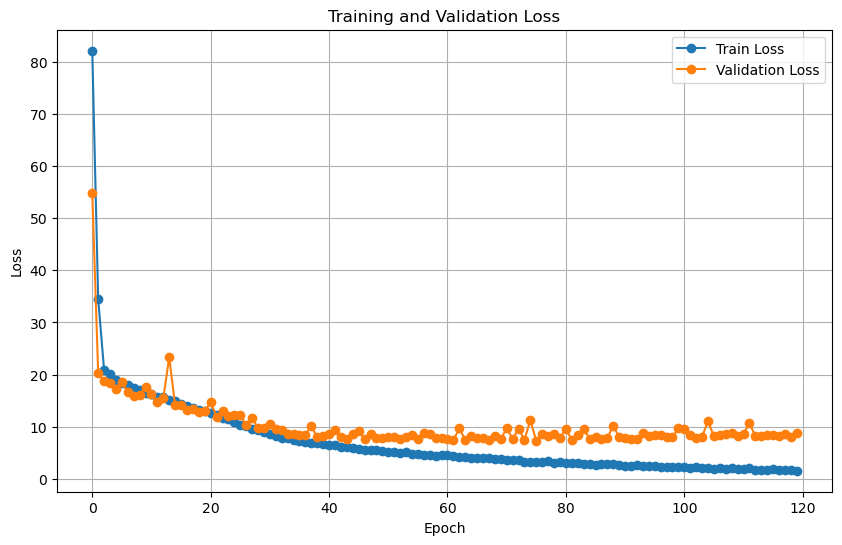

In [272]:
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Train Loss', marker='o')
plt.plot(val_losses, label='Validation Loss', marker='o')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

In [273]:
model.load_state_dict(torch.load("best_model.pth"))
model.eval()

C:\Users\egork\AppData\Local\Temp\ipykernel_12912\3738422358.py:1: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



CarlaControlModel(
  (conv): Sequential(
    (0): Conv2d(15, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): AdaptiveAvgPool2d(output_size=(1, 1))
  )
  (fc_image): Linear(in_features=128, out_features=64, bias=True)
  (fc_traj): Sequential(
    (0): Linear(in_features=40, out_features=32, bias=True)
    (1): ReLU()
    (2): Linear(in_features=32, out_features=16, bias=True)
  )
  (fc_lights): Sequential(
    (0): Linear(in_features=3, out_features=8, bias=True)
    (1): ReLU()
  )
  (head): Sequential(
    (0):

In [274]:
test_loss = 0.0
speed_loss = 0.0
steer_loss = 0.0
throttle_loss = 0.0
brake_loss = 0.0

with torch.no_grad():
    for batch in tqdm(test_loader, desc="Testing"):
        inputs = batch["input"].to(device)
        traj = batch["trajectory"].to(device)
        lights = batch["traffic_lights"].to(device)
        targets = batch["target"].to(device)

        outputs = model(inputs, traj, lights)

        loss = criterion(outputs, targets)
        test_loss += loss.item()

        #Unpacking the loss for each target variable
        diff = torch.abs(outputs - targets)
        speed_loss += diff[:, 0].mean().item()
        steer_loss += diff[:, 1].mean().item()
        throttle_loss += diff[:, 2].mean().item()
        brake_loss += diff[:, 3].mean().item()

n_batches = len(test_loader)
print(f"\nTest Loss: {test_loss / n_batches:.4f}")
print(f"Speed MAE:     {speed_loss / n_batches:.4f}")
print(f"Steer MAE:     {steer_loss / n_batches:.4f}")
print(f"Throttle MAE:  {throttle_loss / n_batches:.4f}")
print(f"Brake MAE:     {brake_loss / n_batches:.4f}")

Testing: 100%|███████████████████████████████████████████████████████████████████████████████████████████| 27/27 [00:06<00:00,  4.25it/s]


Test Loss: 6.5944
Speed MAE:     3.8075
Steer MAE:     0.0814
Throttle MAE:  0.2914
Brake MAE:     0.1477
